**Print the dataset, rename the images in a proper manner**

All files are renamed in the 'yes' directory.
All files are renamed in the 'no' directory.
Images in the 'yes' directory:


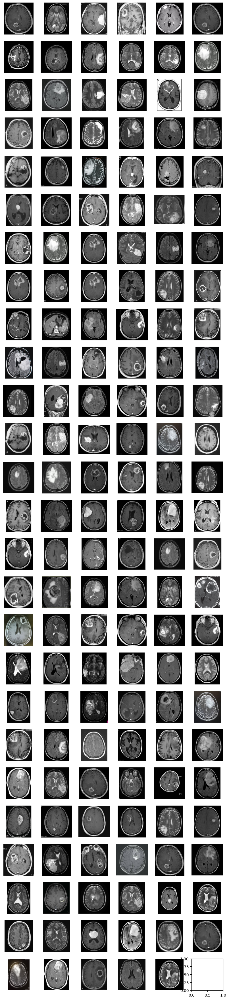

Images in the 'no' directory:


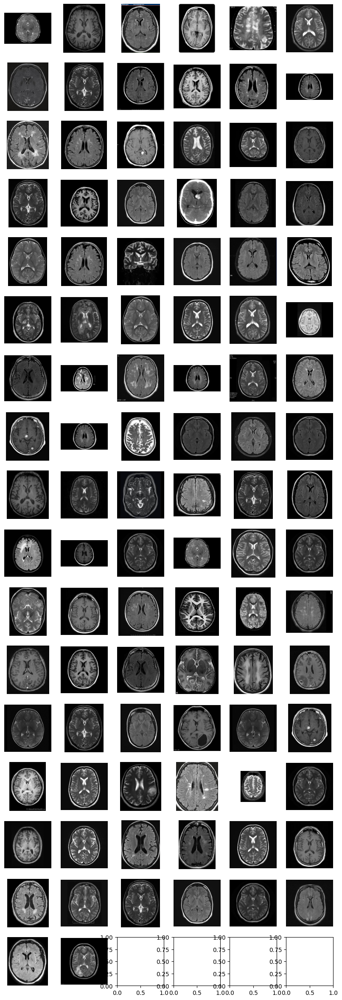

In [2]:
import cv2
import os
import zipfile
import matplotlib.pyplot as plt

#Extract the dataset from the zip file
with zipfile.ZipFile('/content/brain_tumor_dataset.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

#rename files in the "yes" directory
folder_yes = '/content/brain_tumor_dataset/yes' 
count = 1

for filename in os.listdir(folder_yes):
    source = os.path.join(folder_yes, filename)
    destination = os.path.join(folder_yes, "Y_" + str(count) + ".jpg")
    os.rename(source, destination)
    count += 1
print("All files are renamed in the 'yes' directory.")

#Rename files in the "no" directory
folder_no = '/content/brain_tumor_dataset/no' 
count = 1

for filename in os.listdir(folder_no):
    source = os.path.join(folder_no, filename)
    destination = os.path.join(folder_no, "N_" + str(count) + ".jpg")
    os.rename(source, destination)
    count += 1
print("All files are renamed in the 'no' directory.")


#display all images in the "yes" directory
print("Images in the 'yes' directory:")
fig, axs = plt.subplots(26, 6, figsize=(10, 45))
for i, filename in enumerate(os.listdir(folder_yes)):
    if i >= 155:
        break
    if filename.endswith('.jpg'):
        image_path = os.path.join(folder_yes, filename)
        image = cv2.imread(image_path)
        if image is not None:
            row = i // 6
            col = i % 6
            axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axs[row, col].axis('off')
plt.show()

#Display all images in the "no" directory
print("Images in the 'no' directory:")
fig, axs = plt.subplots(17, 6, figsize=(10, 30))
for i, filename in enumerate(os.listdir(folder_no)):
    if i >= 98:
        break
    if filename.endswith('.jpg'):
        image_path = os.path.join(folder_no, filename)
        image = cv2.imread(image_path)
        if image is not None:
            row = i // 6
            col = i % 6
            axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axs[row, col].axis('off')
plt.show()

**Print number of images in each folder**

In [3]:
def count_images(directory):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif', '.bmp']
    image_count = 0

    for filename in os.listdir(directory):
        if any(filename.lower().endswith(ext) for ext in image_extensions):
            image_count += 1

    return image_count

def compare_image_counts(directory1, directory2):
    count1 = count_images(directory1)
    count2 = count_images(directory2)
    return count1, count2

directory_path1 = "/content/brain_tumor_dataset/yes"
directory_path2 = "/content/brain_tumor_dataset/no"

count1, count2 = compare_image_counts(directory_path1, directory_path2)
print("Number of images in the Yes directory:", count1)
print("Number of images in the No directory:", count2)

Number of images in the Yes directory: 155
Number of images in the No directory: 98


**Check the classes balance**

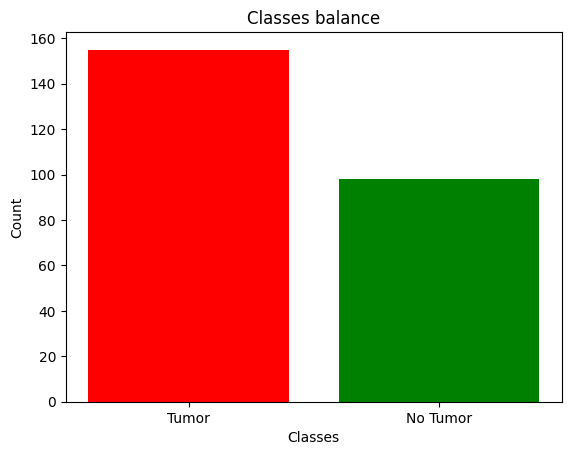

In [4]:
num_yes = count1
num_no = count2

#create the histogram to analyze the balance
labels = ['Tumor', 'No Tumor']
counts = [num_yes, num_no]
colors = ['red', 'green']

plt.bar(labels, counts, color=colors)
plt.xlabel('Classes')
plt.ylabel('Count')
plt.title('Classes balance')
plt.show()

**Augmentation for (yes) images**

In [5]:
import cv2
import os
import zipfile
import matplotlib.pyplot as plt
import numpy as np

#create a function to apply horizontal flip and vertical flip
def flip_image(image):
    flipped_images = []
    flipped_images.append(cv2.flip(image, 0))  
    flipped_images.append(cv2.flip(image, 1))  
    return flipped_images

#Image augmentation for "yes" directory 
augmented_images_folder = '/content/brain_tumor_dataset/yes'
os.makedirs(augmented_images_folder, exist_ok=True)

count = 0  

#loop through existing images and perform augmentation
for filename in os.listdir(folder_yes):
    if count > 40:
        break
    image_path = os.path.join(folder_yes, filename)
    image = cv2.imread(image_path)
    if image is not None:
        flipped_images = flip_image(image)
        #save the augmented images
        for img in flipped_images:
            augmented_filename = os.path.join(augmented_images_folder, "Y_" + str(count) + "_augmented.jpg")
            cv2.imwrite(augmented_filename, img)
            count += 1

print("Image augmentation completed for 'yes_augmented_images' ")

Image augmentation completed for 'yes_augmented_images' 


**Augmentation for (no) images**

In [6]:
import cv2
import os
import zipfile
import matplotlib.pyplot as plt
import numpy as np

#create a function to apply horizontal flip and vertical flip
def flip_image(image):
    flipped_images = []
    flipped_images.append(cv2.flip(image, 0))  
    flipped_images.append(cv2.flip(image, 1))  
    return flipped_images

#Image augmentation for "no" directory
augmented_images_folder = '/content/brain_tumor_dataset/no'
os.makedirs(augmented_images_folder, exist_ok=True)

count = 0  
#loop through existing images and perform augmentation
for filename in os.listdir(folder_no):
    if count > 97:
        break
    image_path = os.path.join(folder_no, filename)
    image = cv2.imread(image_path)
    if image is not None:
        flipped_images = flip_image(image)
        # Save the augmented images
        for img in flipped_images:
            augmented_filename = os.path.join(augmented_images_folder, "N_" + str(count) + "_augmented.jpg")
            cv2.imwrite(augmented_filename, img)
            count += 1

print("Image augmentation completed for 'no_augmented_images' ")

Image augmentation completed for 'no_augmented_images' 


**Check the classes balance**

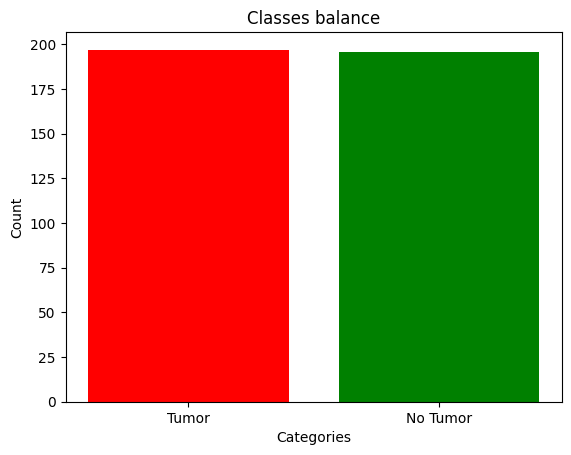

In [7]:
import os
import cv2
import matplotlib.pyplot as plt


#define paths to the "yes" and "no" directories
folder_yes = '/content/brain_tumor_dataset/yes'
folder_no = '/content/brain_tumor_dataset/no'

#count the number of images in the "yes" and "no" directories
num_yes = len([filename for filename in os.listdir(folder_yes) if filename.endswith('.jpg')])
num_augmented = len([filename for filename in os.listdir(folder_no) if filename.endswith('.jpg')])

#create the histogram to analyze the balance
labels = ['Tumor', 'No Tumor']
counts = [num_yes, num_augmented]
colors = ['red', 'green']

plt.bar(labels, counts, color=colors)
plt.xlabel('Categories')
plt.ylabel('Count')
plt.title('Classes balance')
plt.show()

#count the number of images in both directories
num_yes = len([filename for filename in os.listdir(folder_yes) if filename.endswith('.jpg')])
num_no = len([filename for filename in os.listdir(folder_no) if filename.endswith('.jpg')])



**Download the augmented images in yes and no directories**

In [8]:
!zip -r /content/brain_tumor_dataset/yes.zip /content/brain_tumor_dataset/yes
from google.colab import files
files.download("/content/brain_tumor_dataset/yes.zip")

!zip -r /content/brain_tumor_dataset/no.zip /content/brain_tumor_dataset/no
from google.colab import files
files.download("/content/brain_tumor_dataset/no.zip")

  adding: content/brain_tumor_dataset/yes/ (stored 0%)
  adding: content/brain_tumor_dataset/yes/Y_34.jpg (stored 0%)
  adding: content/brain_tumor_dataset/yes/Y_111.jpg (deflated 3%)
  adding: content/brain_tumor_dataset/yes/Y_120.jpg (deflated 6%)
  adding: content/brain_tumor_dataset/yes/Y_22.jpg (deflated 24%)
  adding: content/brain_tumor_dataset/yes/Y_30_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/yes/Y_137.jpg (deflated 34%)
  adding: content/brain_tumor_dataset/yes/Y_23_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/yes/Y_4.jpg (deflated 36%)
  adding: content/brain_tumor_dataset/yes/Y_61.jpg (deflated 35%)
  adding: content/brain_tumor_dataset/yes/Y_11_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/yes/Y_50.jpg (deflated 5%)
  adding: content/brain_tumor_dataset/yes/Y_42.jpg (deflated 0%)
  adding: content/brain_tumor_dataset/yes/Y_94.jpg (deflated 24%)
  adding: content/brain_tumor_dataset/yes/Y_142.jpg (deflated 1%)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/brain_tumor_dataset/no/ (stored 0%)
  adding: content/brain_tumor_dataset/no/N_96.jpg (deflated 6%)
  adding: content/brain_tumor_dataset/no/N_74_augmented.jpg (deflated 11%)
  adding: content/brain_tumor_dataset/no/N_18_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/no/N_36.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/no/N_53_augmented.jpg (deflated 6%)
  adding: content/brain_tumor_dataset/no/N_22.jpg (deflated 1%)
  adding: content/brain_tumor_dataset/no/N_90.jpg (deflated 5%)
  adding: content/brain_tumor_dataset/no/N_2_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/no/N_62_augmented.jpg (deflated 2%)
  adding: content/brain_tumor_dataset/no/N_29_augmented.jpg (deflated 3%)
  adding: content/brain_tumor_dataset/no/N_57.jpg (deflated 1%)
  adding: content/brain_tumor_dataset/no/N_23.jpg (deflated 1%)
  adding: content/brain_tumor_dataset/no/N_46_augmented.jpg (deflated 1%)
  adding: content/brain_tumor_dataset/no/N_3

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Image Processing Technique - Threshold**

In [9]:
import os
import cv2
import matplotlib.pyplot as plt

#function to apply thresholding to images then save them in a separate folder
def apply_thresholding_and_save(folder_path, threshold_value, output_folder):
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
    num_images = min(len(image_files), 195)
    for i in range(num_images):
        image_path = os.path.join(folder_path, image_files[i])
        image = cv2.imread(image_path)
        if image is not None:
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            _, thresholded_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY)
            save_path = os.path.join(output_folder, f"thresholded_{image_files[i]}")
            cv2.imwrite(save_path, thresholded_image)
            print(f"Thresholded image saved: {save_path}")


#define the folders paths
folder_yes = "/content/brain_tumor_dataset/yes"
folder_no = "/content/brain_tumor_dataset/no"
output_folder_yes = "/content/Thresholded_yes"
output_folder_no = "/content/Thresholded_no"

#apply thresholding to the "yes" images and save them in the output folder
threshold_value_yes = 125
apply_thresholding_and_save(folder_yes, threshold_value_yes, output_folder_yes)

#apply thresholding to the "no" images and save them in the output folder
threshold_value_no = 177
apply_thresholding_and_save(folder_no, threshold_value_no, output_folder_no)

Thresholded image saved: /content/Thresholded_yes/thresholded_Y_34.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_111.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_120.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_22.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_30_augmented.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_137.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_23_augmented.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_4.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_61.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_11_augmented.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_50.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_42.jpg
Thresholded image saved: /content/Thresholded_yes/thresholded_Y_94.jpg
Thresholded image saved: /content/Thresholded

**Display the thresholded images**

Images in the 'yes' directory:


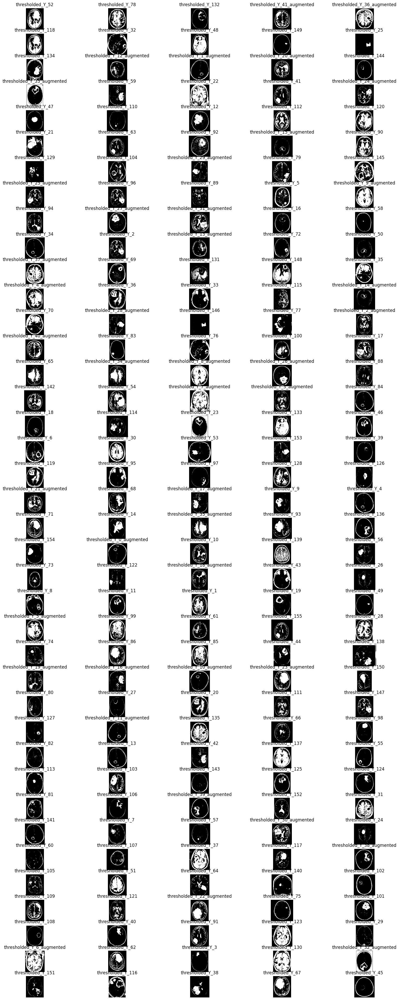

Images in the 'no' directory:


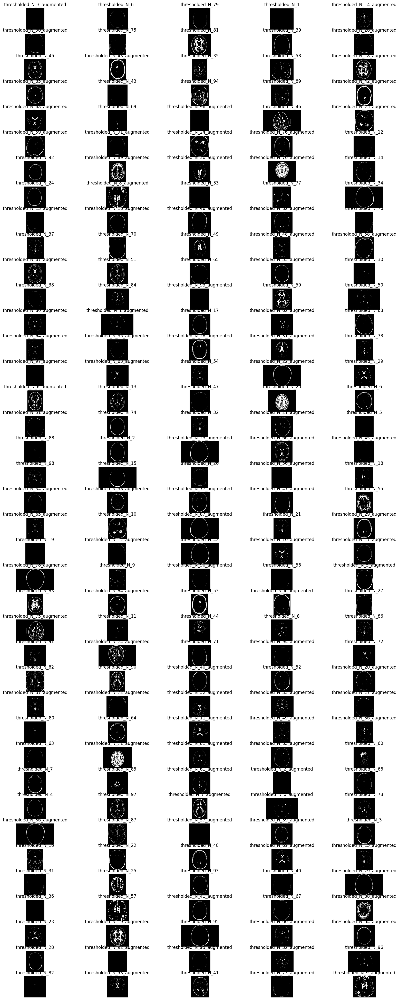

In [10]:

import os
import cv2
import matplotlib.pyplot as plt

#function to display images
def display_images(folder_path, title):
    print(f"Images in the '{title}' directory:")
    fig, axs = plt.subplots(39, 5, figsize=(20, 50))
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
    num_images = min(len(image_files), 195)
    for i in range(num_images):
        image_path = os.path.join(folder_path, image_files[i])
        image = cv2.imread(image_path)
        if image is not None:

            row = i // 5
            col = i % 5
            axs[row, col].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            axs[row, col].axis('off')
            axs[row, col].set_title(image_files[i].split('.')[0])
    plt.show()


#display images in "yes" directory
display_images("/content/Thresholded_yes", "yes")

#display images in "no" directory
display_images("/content/Thresholded_no", "no")

**Image Processing Technique - Contrast Stretching and Segmentation**

Images in the 'yes' directory:


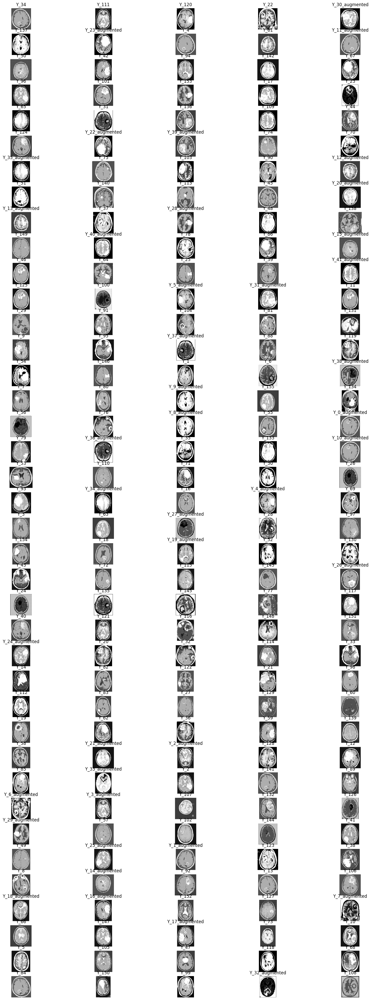

Images in the 'no' directory:


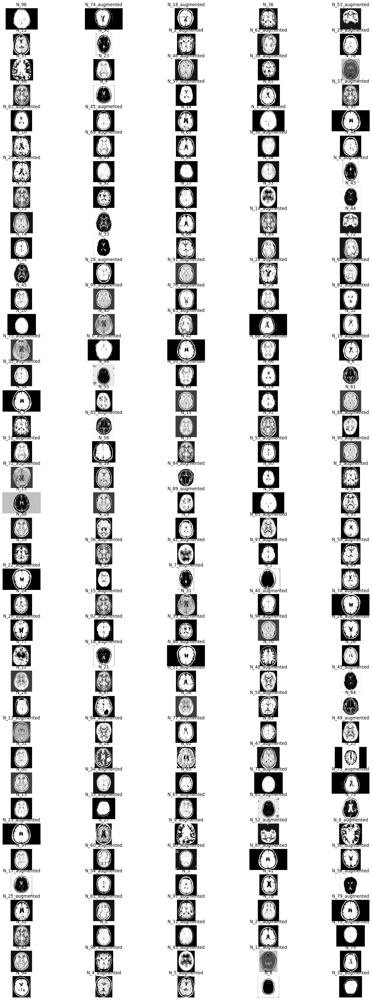

In [27]:
import os
import cv2
import matplotlib.pyplot as plt
from skimage.segmentation import chan_vese
from PIL import Image, ImageEnhance
import numpy as np

#function to apply contrast stretching to an image
def apply_contrast_stretching(image, factor):
    image_pil = Image.fromarray(image)
    if image_pil.mode != "L":
        image_pil = image_pil.convert("L")
    enhancer = ImageEnhance.Contrast(image_pil)
    enhanced_image_pil = enhancer.enhance(factor)
    enhanced_image = np.array(enhanced_image_pil)
    return enhanced_image


#function to apply Chan-Vese segmentation
def apply_chanvese_segmentation(image):
    if image.ndim == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray_image = image
    chanvese_image = chan_vese(gray_image, max_num_iter=15, extended_output=True)
    return chanvese_image[0]

#display images, and call the functions
def display_images_with_segmentation_and_contrast_stretching(folder_path, title, factor, output_folder):
    print(f"Images in the '{title}' directory:")
    fig, axs = plt.subplots(39, 5, figsize=(20, 50))
    image_files = [f for f in os.listdir(folder_path) if f.endswith('.jpg')]
    num_images = min(len(image_files), 195)
    for i in range(num_images):
        image_path = os.path.join(folder_path, image_files[i])
        image = cv2.imread(image_path)
        if image is not None:
            contrast_stretched_image = apply_contrast_stretching(image, factor)
            segmented_image = apply_chanvese_segmentation(contrast_stretched_image)
            row = i // 5
            col = i % 5
            axs[row, col].imshow(segmented_image, cmap="gray")
            axs[row, col].axis('off')
            axs[row, col].set_title(image_files[i].split('.')[0])  

            save_path = os.path.join(output_folder, f"cont_stretching_segmentation{image_files[i]}")

            segmented_image = (segmented_image * 255).astype(np.uint8)

            cv2.imwrite(save_path, segmented_image)

    plt.show()

folder_yes = "/content/brain_tumor_dataset/yes"
folder_no = "/content/brain_tumor_dataset/no"
output_folder_yes = "/content/contrast_stretch_segmentation/yes"
output_folder_no = "/content/contrast_stretch_segmentation/no"

#display images in "yes" directory after applying Chan-Vese segmentation and contrast stretching 
display_images_with_segmentation_and_contrast_stretching(folder_yes, "yes", 1.3,output_folder_yes)

#display images in "no" directory after applying Chan-Vese segmentation and contrast stretching 
display_images_with_segmentation_and_contrast_stretching(folder_no, "no", 3, output_folder_no)

**Download the Contrast Streached and Segmented images**

In [29]:
!zip -r /content/contrast_stretch_segmentation.zip /content/contrast_stretch_segmentation
from google.colab import files
files.download("/content/contrast_stretch_segmentation.zip")

  adding: content/contrast_stretch_segmentation/ (stored 0%)
  adding: content/contrast_stretch_segmentation/.ipynb_checkpoints/ (stored 0%)
  adding: content/contrast_stretch_segmentation/yes/ (stored 0%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_132.jpg (deflated 27%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_41_augmented.jpg (deflated 9%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_90.jpg (deflated 9%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_39_augmented.jpg (deflated 11%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_18.jpg (deflated 52%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_137.jpg (deflated 6%)
  adding: content/contrast_stretch_segmentation/yes/cont_stretching_segmentationY_147.jpg (deflated 27%)
  adding: content/contrast_stretch_segmentatio

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**Download the Thresholded images**

In [ ]:
!zip -r /content/Thresholded_no.zip /content/Thresholded_no
from google.colab import files
files.download("/content/Thresholded_no.zip")

!zip -r /content/Thresholded_yes.zip /content/Thresholded_yes
from google.colab import files
files.download("/content/Thresholded_yes.zip")

  adding: content/Thresholded_no/ (stored 0%)
  adding: content/Thresholded_no/thresholded_N_92.jpg (deflated 41%)
  adding: content/Thresholded_no/thresholded_N_51.jpg (deflated 8%)
  adding: content/Thresholded_no/thresholded_N_67.jpg (deflated 28%)
  adding: content/Thresholded_no/thresholded_N_26.jpg (deflated 5%)
  adding: content/Thresholded_no/thresholded_N_70.jpg (deflated 62%)
  adding: content/Thresholded_no/thresholded_N_59_augmented.jpg (deflated 5%)
  adding: content/Thresholded_no/thresholded_N_50_augmented.jpg (deflated 18%)
  adding: content/Thresholded_no/thresholded_N_90_augmented.jpg (deflated 11%)
  adding: content/Thresholded_no/thresholded_N_48.jpg (deflated 7%)
  adding: content/Thresholded_no/thresholded_N_21.jpg (deflated 16%)
  adding: content/Thresholded_no/thresholded_N_81.jpg (deflated 26%)
  adding: content/Thresholded_no/thresholded_N_42_augmented.jpg (deflated 7%)
  adding: content/Thresholded_no/thresholded_N_50.jpg (deflated 11%)
  adding: content/Thre

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

  adding: content/Thresholded_yes/ (stored 0%)
  adding: content/Thresholded_yes/thresholded_Y_80.jpg (deflated 5%)
  adding: content/Thresholded_yes/thresholded_Y_3_augmented.jpg (deflated 9%)
  adding: content/Thresholded_yes/thresholded_Y_5.jpg (deflated 24%)
  adding: content/Thresholded_yes/thresholded_Y_128.jpg (deflated 3%)
  adding: content/Thresholded_yes/thresholded_Y_16.jpg (deflated 6%)
  adding: content/Thresholded_yes/thresholded_Y_148.jpg (deflated 9%)
  adding: content/Thresholded_yes/thresholded_Y_38_augmented.jpg (deflated 6%)
  adding: content/Thresholded_yes/thresholded_Y_131.jpg (deflated 6%)
  adding: content/Thresholded_yes/thresholded_Y_149.jpg (deflated 5%)
  adding: content/Thresholded_yes/thresholded_Y_20_augmented.jpg (deflated 4%)
  adding: content/Thresholded_yes/thresholded_Y_30_augmented.jpg (deflated 15%)
  adding: content/Thresholded_yes/thresholded_Y_47.jpg (deflated 5%)
  adding: content/Thresholded_yes/thresholded_Y_89.jpg (deflated 4%)
  adding: co

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>